<a href="https://colab.research.google.com/github/OlgaShevel/Computer-Vision-Projects/blob/main/classification_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Способ выбрать оптимальные предобученные модели для классификации неразмеченных изображений**

**(Selection of optimal pre-trained models from the KerasCV package for classification of untagged images)**

При решении задачи классификации изображений зачастую на практике картинки
не имеют меток. В таком случае целесообразно не строить собственную CNN,
а применить предобученную модель. Но какую выбрать?

Можно провести эксперименты, предложив нескольким моделям датасет с неразмеченными
изображениями, похожими на те, которые предстоит анализировать.

При этом, естественно, условия эксперимента позволяют специальным образом пометить изображения - в данном случае логика меток основана на названиях файлов датасета. Качество работы моделей можно оценить, визуализировав его при помощи кластеризации. И уже для нее получить метрику,
например, Adjusted Rand Index (измеряет сходство истинной маркировки и кластерной маркировки).

Таким способом можно получить представление, какие модели вероятнее всего лучше справятся с предстоящей задачей классификации.

**ПАРАМЕТРЫ ЭКСПЕРИМЕНТА**

1) Шесть предобученных моделей из библиотеки модульных компонентов KerasCV
- VGG16
- ResNet50
- InceptionV3
- MobileNetV2
- EfficientNetB0
- ConvNeXtTiny


2) Два датасета: на 2 класса по 1000 изображений и 4 класса по 500 изображений

3) Три кластеризатора (настройки по умочанию) в связке с методом уменьшения
размерности и визуализации:
- PCA + K-Means
- UMAP + HDBSCAN
- tSNE + AgglomerativeClustering

Так можно
- обеспечить разнообразие вариантов кластеризации, чтобы оценить стабильность результатов модели
- подобрать наиболее подходящий кластеризатор.

4) Предобученные модели с замороженными весами подаются в пользовательскую
функцию image_feature() и выступают в качестве экстракторов признаков изображений. Затем массив
выделенных признаков подается в кластеризаторы.

Время обучения каждой модели оказалось разным, что зависит, в первую очередь,
от архитектуры. Например, разброс времени обучения моделей для датасета
на 4 класса в данном эксперименте составил от 06:10 мин для MobileNetV2
до 1:05:32 для ConvNeXtTiny. Обчучение велось в google.colab на cpu.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import os
import shutil
import random
import cv2
import sys
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.colors import ListedColormap
from PIL import Image
from sklearn.metrics import adjusted_rand_score
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering

import matplotlib.lines as mlines

import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install umap
!pip install umap-learn
!pip install hdbscan

In [ ]:
import umap
import hdbscan

In [ ]:
# Dataset in two categories

!git clone https://github.com/laxmimerit/dog-cat-full-dataset.git
!mkdir all_images
!cp /content/dog-cat-full-dataset/data/test/cats/* /content/all_images
!cp /content/dog-cat-full-dataset/data/test/dogs/* /content/all_images

Cloning into 'dog-cat-full-dataset'...
remote: Enumerating objects: 25027, done.
remote: Total 25027 (delta 0), reused 0 (delta 0), pack-reused 25027
Receiving objects: 100% (25027/25027), 541.62 MiB | 40.50 MiB/s, done.
Resolving deltas: 100% (5/5), done.
Updating files: 100% (25001/25001), done.


In [ ]:
# Dataset in four categories
# Classes left: airplane, flower, motorcycle, man

https://www.kaggle.com/datasets/prasunroy/natural-images/data

**ПОДГОТОВКА ДАТАСЕТА НА 2 КЛАССА Cats vs Dogs**  

Для наглядности возьмем по 1000 изображений

In [ ]:
# количество файлов в папках

def count_files(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len(files)
    return count

dir_cats = "/content/dog-cat-full-dataset/data/train/cats"
files_cats = count_files(dir_cats)
print("Количество файлов:", files_cats)

dir_dogs = "/content/dog-cat-full-dataset/data/train/dogs"
files_dogs = count_files(dir_dogs)
print("Количество файлов:", files_dogs )

Количество файлов: 10000
Количество файлов: 10000


In [ ]:
# оставить только файлы 224-260 px

dir_cats = "/content/dog-cat-full-dataset/data/train/cats"
dir_dogs = "/content/dog-cat-full-dataset/data/train/dogs"
cat_clust = "/content/drive/MyDrive/cat_cluster"
dog_clust = "/content/drive/MyDrive/dog_cluster"

count_cats = 0
for file_name in os.listdir(dir_cats):
    file_path = os.path.join(dir_cats, file_name)
    image = Image.open(file_path)
    width, height = image.size
    if 224 <= width <= 260 or 224 <= height <= 260:
        count_cats += 1
        shutil.move(file_path, os.path.join(cat_clust, file_name))

count_dogs = 0
for file_name in os.listdir(dir_dogs):
    file_path = os.path.join(dir_dogs, file_name)
    image = Image.open(file_path)
    width, height = image.size
    if 224 <= width <= 260 or 224 <= height <= 260:
        count_dogs += 1
        shutil.move(file_path, os.path.join(dog_clust, file_name))

In [ ]:
# Удалить файлы так, чтобы в каждой папке осталось по 1000 изображений

cat_clust = "/content/drive/MyDrive/cat_cluster"
dog_clust = "/content/drive/MyDrive/dog_cluster"

cat_files = os.listdir(cat_clust)
if len(cat_files) > 1000:
    files_to_delete = len(cat_files) - 1000
    files_to_keep = random.sample(cat_files, 1000)
    for file_name in cat_files:
        if file_name not in files_to_keep:
            file_path = os.path.join(cat_clust, file_name)
            os.remove(file_path)

dog_files = os.listdir(dog_clust)
if len(dog_files) > 1000:
    files_to_delete = len(dog_files) - 1000
    files_to_keep = random.sample(dog_files, 1000)
    for file_name in dog_files:
        if file_name not in files_to_keep:
            file_path = os.path.join(dog_clust, file_name)
            os.remove(file_path)

In [ ]:
cat_clust = "/content/drive/MyDrive/cat_cluster"
files_cats = count_files(cat_clust)
print("Количество файлов:", files_cats)

dog_clust = "/content/drive/MyDrive/dog_cluster"
files_dogs = count_files(dog_clust)
print("Количество файлов:", files_dogs )

Количество файлов: 1000
Количество файлов: 1000


In [ ]:
# Сложить картинки в одну папку

dir_cat = "/content/drive/MyDrive/cat_cluster"
dir_dog = "/content/drive/MyDrive/dog_cluster"
clusst = '/content/drive/MyDrive/1000_bin/clust_1000'

if not os.path.exists(clusst):
    os.makedirs(clusst)

for source_dir in [dir_cat, dir_dog]:
    for root, dirs, files in os.walk(source_dir):
        for file in files:
            source_file = os.path.join(root, file)
            destination_file = os.path.join(clusst, file)
            shutil.move(source_file, clusst)

In [ ]:
dir_cluster = count_files(clusst)
print("Количество файлов:", dir_cluster)

Количество файлов: 2000


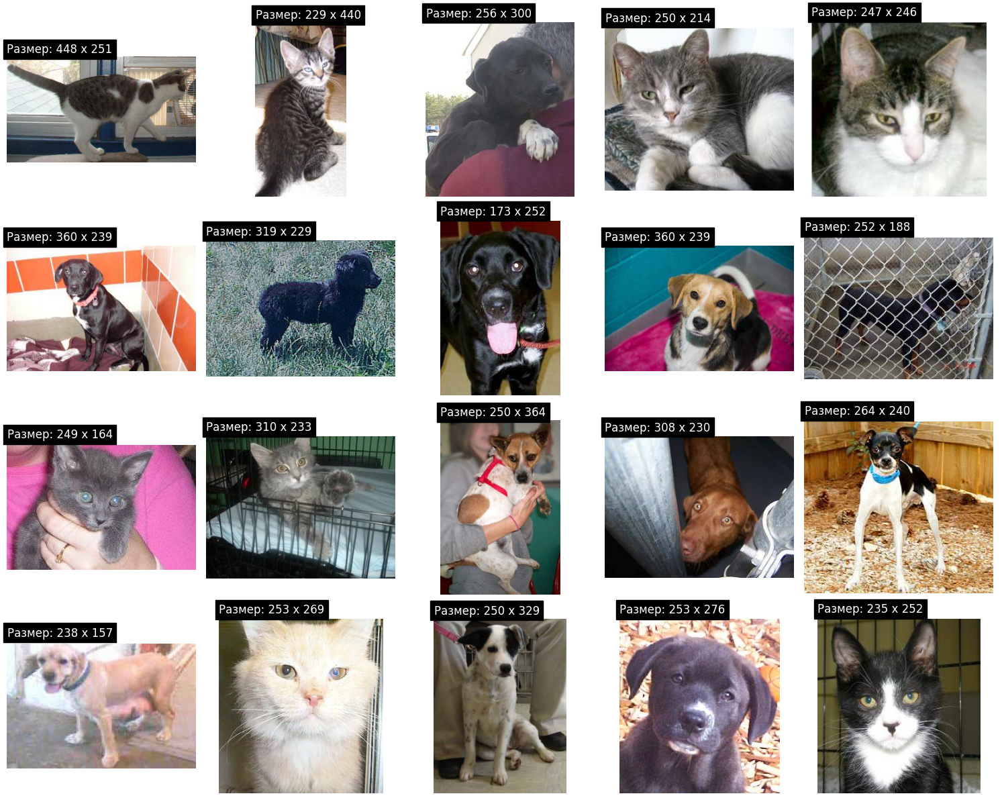

In [ ]:
# Вывести из папки 20 случайных изображений

num_images = 20
num_columns = 5
num_rows = 4

file_list = os.listdir(clusst)
random_images = random.sample(file_list, num_images)
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 12))

for i, image_name in enumerate(random_images):
    row = i // num_columns
    col = i % num_columns
    image_path = os.path.join(clusst, image_name)
    image = Image.open(image_path)
    axes[row, col].imshow(image)
    axes[row, col].axis('off')
    axes[row, col].text(0, -10, f"Размер: {image.size[0]} x {image.size[1]}",
                        fontsize=12, color='white', backgroundcolor='black')

plt.tight_layout()
plt.show()

**Датасет на 4 класса**

airplane, flower, motorbike, person

По 500 файлов каждой категории слиты в общую папку clust_Four_500.

Здесь не будем "помогать" моделям с оптимизацией размеров, подадим датасет как есть.

НЮАНС: все фото самолетов и мотоциклов ориентированы слева направо.

In [ ]:
!ls -l /content/drive/MyDrive/500_Four/Models500_FourFour/clust_Four_500 | grep -c ".jpg\|.jpeg\|.png\|.gif"

2000


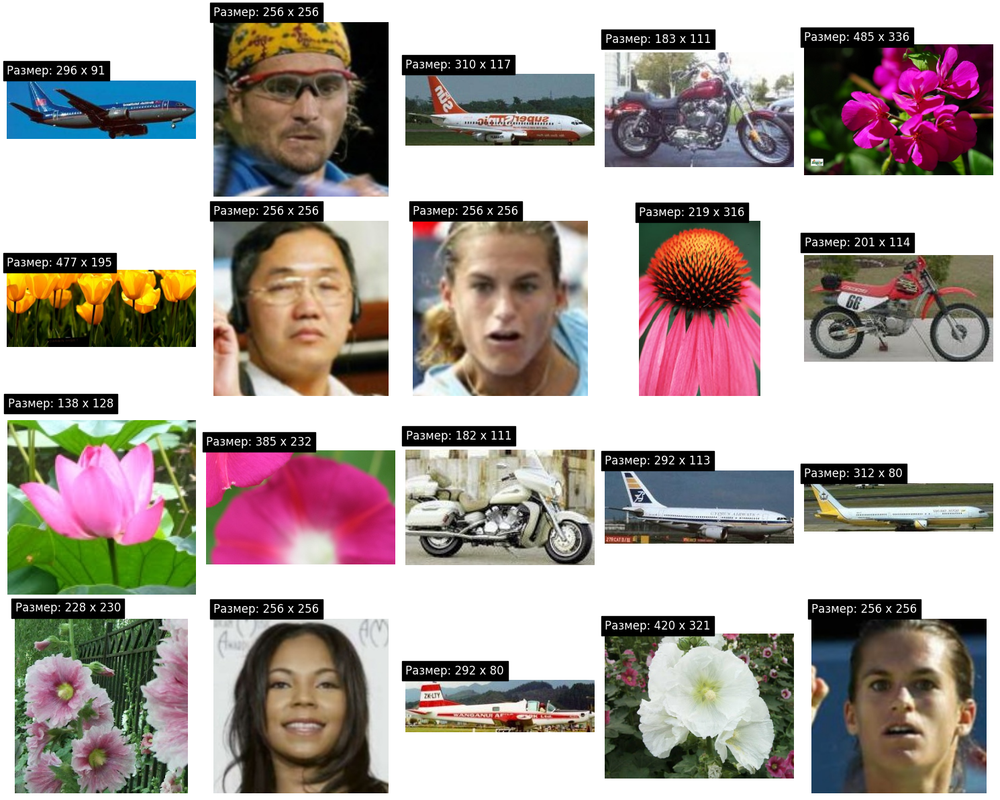

In [ ]:
clusst_four = '/content/drive/MyDrive/500_Four/Models500_FourFour/clust_Four_500'

num_images = 20
num_columns = 5
num_rows = 4

file_list = os.listdir(clusst_four)
random_images = random.sample(file_list, num_images)

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 12))
for i, image_name in enumerate(random_images):
    row = i // num_columns
    col = i % num_columns
    image_path = os.path.join(clusst_four, image_name)
    image = Image.open(image_path)
    axes[row, col].imshow(image)
    axes[row, col].axis('off')
    axes[row, col].text(0, -10, f"Размер: {image.size[0]} x {image.size[1]}",
                        fontsize=12, color='white', backgroundcolor='black')

plt.tight_layout()
plt.show()

**Предобученные модели из пакета KerasCV для анализа признаков**

In [ ]:
# Models were selected randomly.
# The sizes of the images on which the neural networks were trained are indicated

df = pd.DataFrame({'Модель': ['VGG-16', 'ResNet50', 'InceptionV3',
                              'MobileNetV2', 'EfficientNetB0', 'ConvNeXtTiny'],
                   'Год': ['2015', '2015', '2015', '2017', '2020', '2022'],
                   'Размер': ['(224, 224, 3)', '(224, 224, 3)', '(299, 299, 3)',
                              '(224, 224, 3)', '(224, 224, 3)', '(224, 224, 3)']})
df

,Модель,Год,Размер
0,VGG-16,2015,"(224, 224, 3)"
1,ResNet50,2015,"(224, 224, 3)"
2,InceptionV3,2015,"(299, 299, 3)"
3,MobileNetV2,2017,"(224, 224, 3)"
4,EfficientNetB0,2020,"(224, 224, 3)"
5,ConvNeXtTiny,2022,"(224, 224, 3)"


In [ ]:
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications import ConvNeXtTiny
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from keras.applications import MobileNetV2

In [ ]:
!rm -rf .ipynb_checkpoints

In [ ]:
# папка с файлами, подается в функцию image_feature()

img_path = [os.path.join('/content/drive/MyDrive/500_Four/Models500_FourFour/clust_Four_500', f) for f
            in os.listdir('/content/drive/MyDrive/500_Four/Models500_FourFour/clust_Four_500')]

In [ ]:
# Функция preprocess_input() из keras
# автоматически преобразует изображения к размеру обучения модели

def image_feature(models, direc):
    sys.stdout = open(os.devnull, 'w')
    for model_name in models:
        model = model_name(weights='imagenet', include_top=False)

        features = []
        img_name = []

        for i in tqdm(direc):
            img = image.load_img(i, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)
            x = preprocess_input(x)
            feat = model.predict(x)
            feat = feat.flatten()
            features.append(feat)
            img_name.append(os.path.basename(i))
        sys.stdout = sys.__stdout__
        plt.ioff()

        np.save('/content/drive/MyDrive/500_Four/Models500_FourFour/img_features_{}.npy'.format(model_name.__name__), features)
        with open('/content/drive/MyDrive/500_Four/Models500_FourFour/img_path.txt', 'w') as file:
          file.write('\n'.join([os.path.basename(path) for path in img_name]))

# список подаваемых в функцию предобученных моделей
models = [VGG16, ResNet50, InceptionV3, MobileNetV2, EfficientNetB0, ConvNeXtTiny]

image_feature(models, img_path)

100%|██████████| 2000/2000 [1:05:32<00:00,  1.97s/it]


In [ ]:
# Подгрузить сохраненные файлы датасета на 2 класса

with open('/content/drive/MyDrive/1000_bin/Models1000_bin/img_path.txt', 'r', encoding='UTF-8') as f:
    content = f.read()
    filess = content.strip().split('\n')

npy_folder = '/content/drive/MyDrive/1000_bin/Models1000_bin'
features_list = []
models = ['VGG16', 'ResNet50', 'InceptionV3', 'MobileNetV2', 'EfficientNetB0', 'ConvNeXtTiny']

for model in models:
    file_name = f"img_features_{model}.npy"
    file_path = os.path.join(npy_folder, file_name)
    features = np.load(file_path)
    features_list.append(features)

In [ ]:
# в названиях файлов есть слова cat и dog

image_cluster = pd.DataFrame(filess, columns=['image'])
image_cluster

,image
0,cat.11053.jpg
1,cat.9751.jpg
2,cat.2484.jpg
3,cat.10783.jpg
4,cat.3841.jpg
...,...
1995,dog.9786.jpg
1996,dog.11579.jpg
1997,dog.9680.jpg
1998,dog.486.jpg


In [ ]:
# Подгрузить сохраненные файлы датасета на 4 класса

with open('/content/drive/MyDrive/500_Four/Models500_FourFour/img_path.txt', 'r', encoding='UTF-8') as f:
    content = f.read()
    filess = content.strip().split('\n')

npy_folder = '/content/drive/MyDrive/500_Four/Models500_FourFour'
features_list = []
models = ['VGG16', 'ResNet50', 'InceptionV3', 'MobileNetV2', 'EfficientNetB0', 'ConvNeXtTiny']

for model in models:
    file_name = f"img_features_{model}.npy"
    file_path = os.path.join(npy_folder, file_name)
    features = np.load(file_path)
    features_list.append(features)

In [ ]:
# в названиях файлов есть слова: airplane, flower, motorbike и person

image_cluster = pd.DataFrame(filess, columns=['image'])
image_cluster

,image
0,person_0942.jpg
1,person_0272.jpg
2,person_0270.jpg
3,person_0264.jpg
4,person_0267.jpg
...,...
1995,airplane_0021.jpg
1996,airplane_0023.jpg
1997,airplane_0018.jpg
1998,airplane_0019.jpg


**КЛАСТЕРИЗАЦИЯ**

- ***Левый график*** - результат работы кластеризатора.

- ***Правый график*** - истинное расположение элементов с метками, которые получены благодаря названиям файлов. Применена функция text. Назначение категориям конкретных цветов неоправданно усложняет код, так как кластеризаторы на левом графике могут придавать одним и тем же классам моделей разные цвета.

- Метрика ***Adjusted Rand Index (ARI)*** - оценивает степень сходства между идентифицированными элементами и достоверными элементами. Идеально совпадающие метки получают оценку 1.0, полное несовпадение - 0.0.

**Кластеризация на 2 класса по 1000 изображений**

In [ ]:
def zzz(features, image_cluster, model, filess, kmeans=True, HDBSCAN=True, hierarchical=True):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    if kmeans:
        pca = PCA(n_components=2)
        clust_embedding = pca.fit_transform(features)
        kmeans = KMeans(n_clusters=2, n_init=10)
        clusters = kmeans.fit_predict(clust_embedding)
    if HDBSCAN:
        clust_embedding = umap.UMAP(init='random', n_neighbors=5, n_components=2, min_dist=0.0).fit_transform(features)
        hdbscan_ = hdbscan.HDBSCAN(min_samples=120, min_cluster_size=80)
        clusters = hdbscan_.fit_predict(clust_embedding)
    if hierarchical:
        clust_embedding = TSNE(n_components=2, verbose=0, n_iter=20000).fit_transform(features)
        clustering = AgglomerativeClustering(n_clusters=2, linkage='average')
        clusters = clustering.fit_predict(clust_embedding)

    image_cluster["clusterid"] = clusters

    class0 = len(image_cluster[image_cluster["clusterid"] == 0])
    class1 = len(image_cluster[image_cluster["clusterid"] == 1])
    unclear = len(image_cluster[image_cluster["clusterid"] == -1])

    class0_counts = [image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('cat').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('dog').sum()]

    class1_counts = [image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('cat').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('dog').sum()]

    unclear_counts = [image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('cat').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('dog').sum()]

    # Визуализация кластеризации
    cluster_names = ['Class0', 'Class1', 'Unclear']
    scatter = ax[0].scatter(clust_embedding[:, 0], clust_embedding[:, 1], c=clusters, s=14, marker="o",
                            linewidth=0.3, edgecolor='white', picker=True, cmap='rainbow')

    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_xlabel("X")
    ax[0].set_ylabel("Y")
    if kmeans:
        ax[0].set_title(f'PCA/KMeans - {model} \n'
                        f'"cat", "dog" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Unclear, {unclear}: {unclear_counts}', fontsize=10, ha='center')
    if HDBSCAN:
        ax[0].set_title(f'UMAP/HDBSCAN - {model} \n'
                        f'"cat", "dog" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Unclear, {unclear}: {unclear_counts}', fontsize=10, ha='center')
    if hierarchical:
        ax[0].set_title(f'tSNE/Agglomerative - {model} \n'
                        f'"cat", "dog" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Unclear, {unclear}: {unclear_counts}', fontsize=10, ha='center')

    ax[0].legend(handles=scatter.legend_elements()[0],
                  labels=cluster_names, loc='upper center',
                  bbox_to_anchor=(1.08, 1), fontsize=8, markerscale=1)

    # Визуализация ошибочных точек
    for i in range(len(clust_embedding)):
        filename = os.path.basename(filess[i])
        name, extension = os.path.splitext(filename)
        first_letter = name[0]
        if 'cat' in filename.lower():
            label = 'c'
        elif 'dog' in filename.lower():
            label = 'd'

        if label == 'c':
            color = 'dimgray'
        elif label == 'd':
            color = 'black'

        text = plt.text(clust_embedding[i, 0], clust_embedding[i, 1], label, color=color, fontsize=8)

    ax[1].scatter(clust_embedding[:, 0], clust_embedding[:, 1], c=clusters, s=16, marker="o",
                  linewidth=0.3, picker=True, alpha=0.6, cmap=ListedColormap(['white', 'white']))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_xlabel("X")
    ax[1].set_ylabel("Y")

    label = [0 if "dog" in fil else 1 for fil in filess]
    ari = adjusted_rand_score(clusters, label)
    ax[1].set_title(f'Ошибки {model},\nAdjusted Rand Index {ari:.4f}', fontsize=10)

    if kmeans:
        with open('/content/drive/MyDrive/FFF/ari_kmeans22.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')
    elif HDBSCAN:
        with open('/content/drive/MyDrive/FFF/ari_HDBSCAN2.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')
    elif hierarchical:
        with open('/content/drive/MyDrive/FFF/ari_hierarchical2.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')

    plt.tight_layout()
    plt.show()

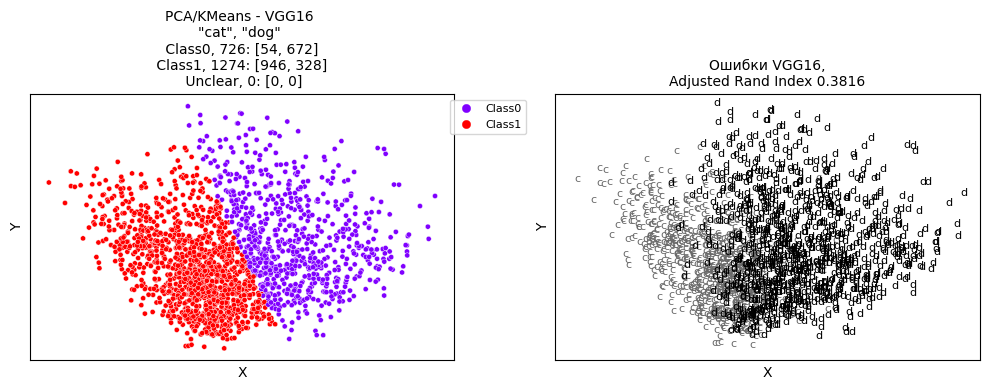

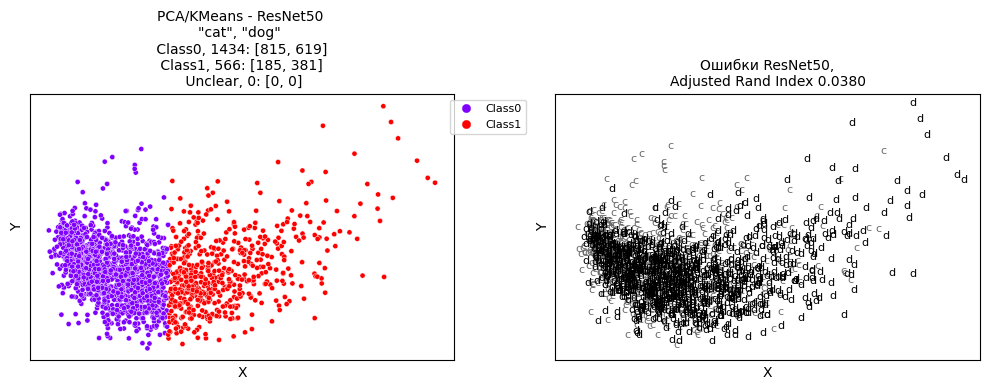

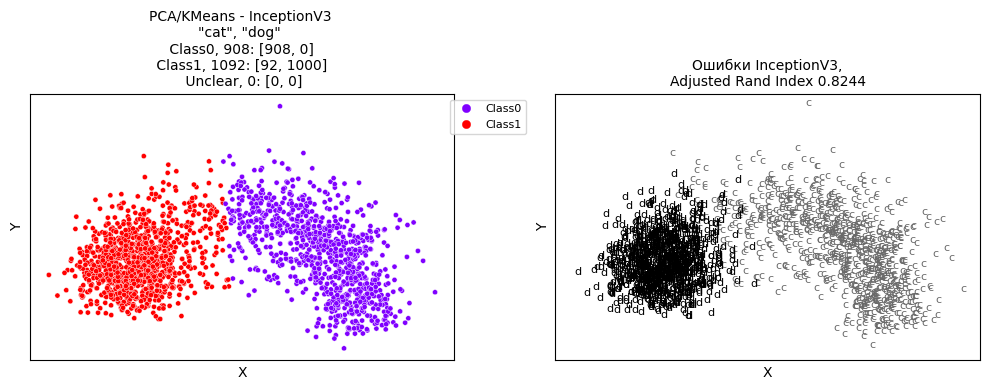

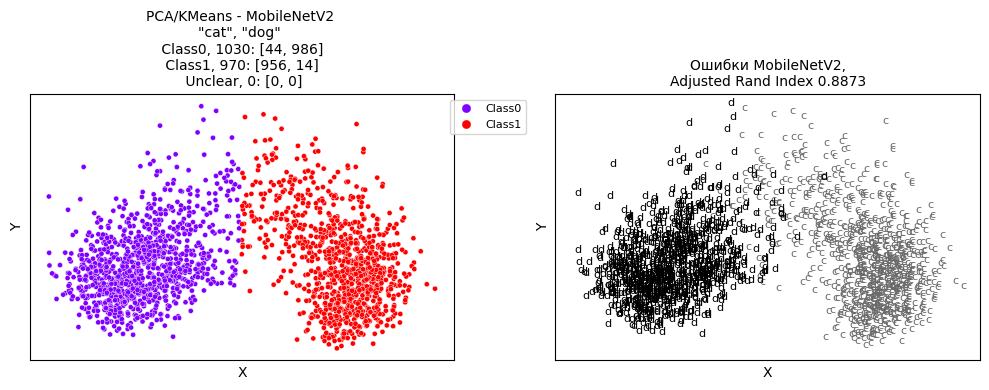

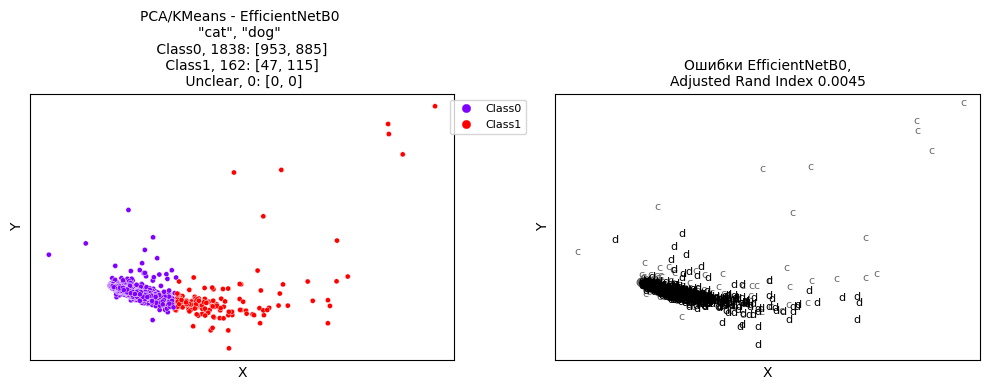

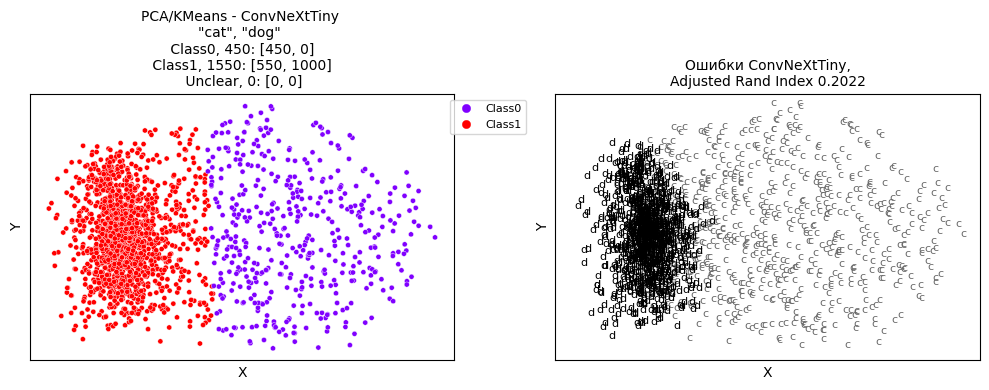

In [ ]:
# Вызов функции с кластеризатором KMeans на 2 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=True, HDBSCAN=False, hierarchical=False)

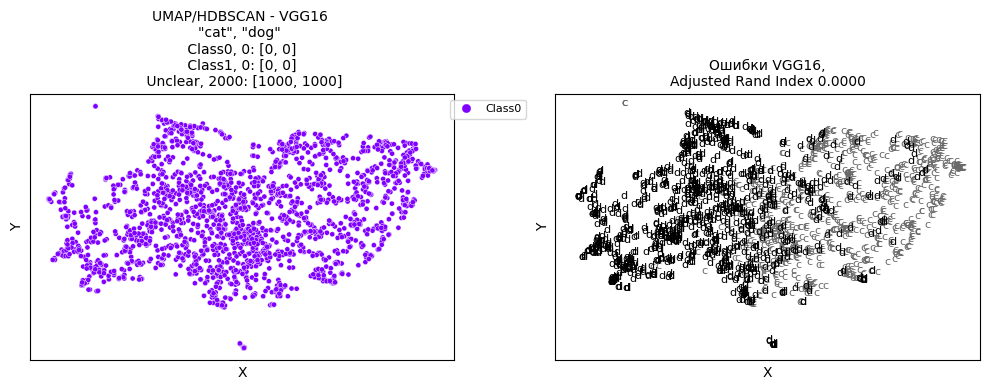

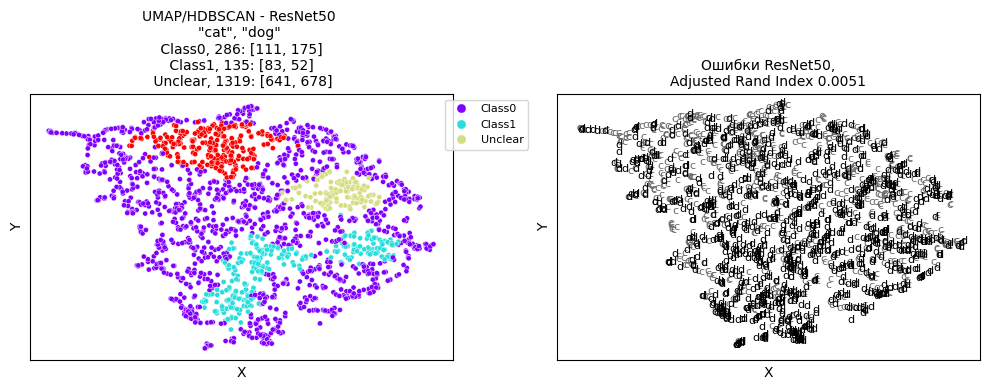

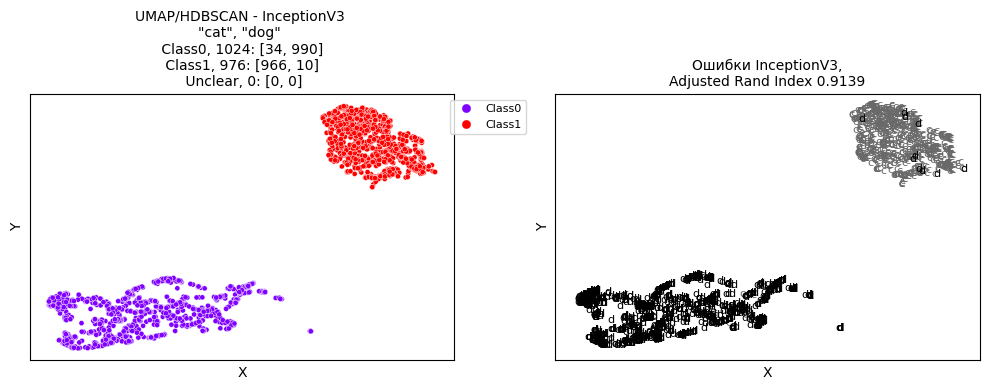

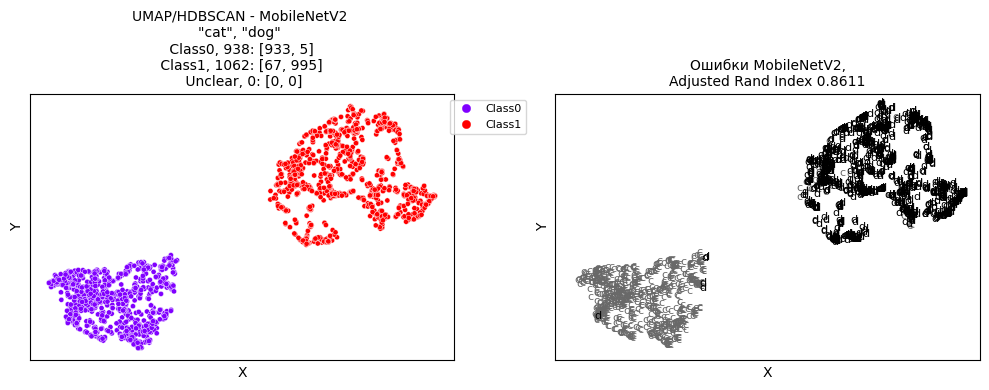

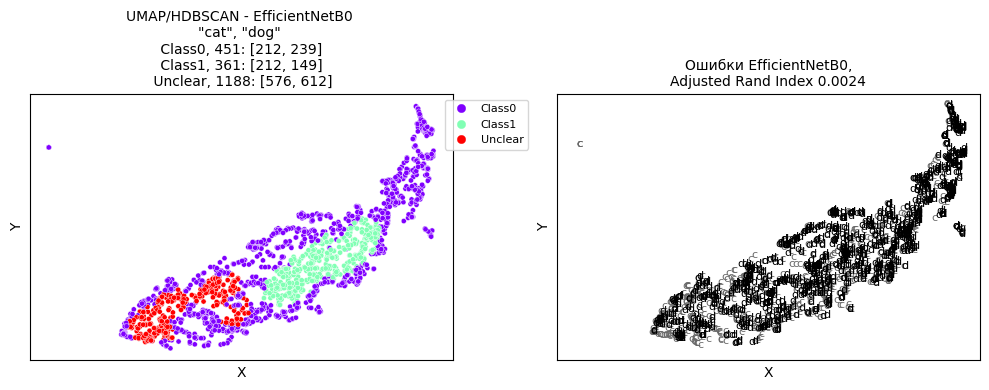

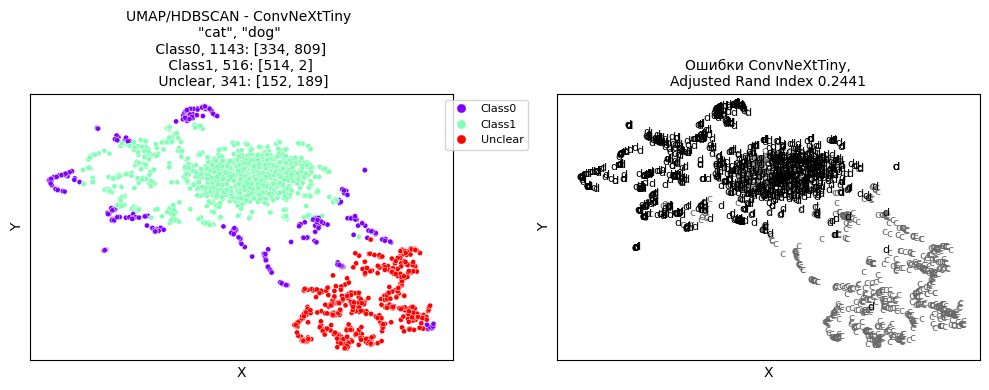

In [ ]:
# Вызов функции с кластеризатором HDBSCAN на 2 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=False, HDBSCAN=True, hierarchical=False)

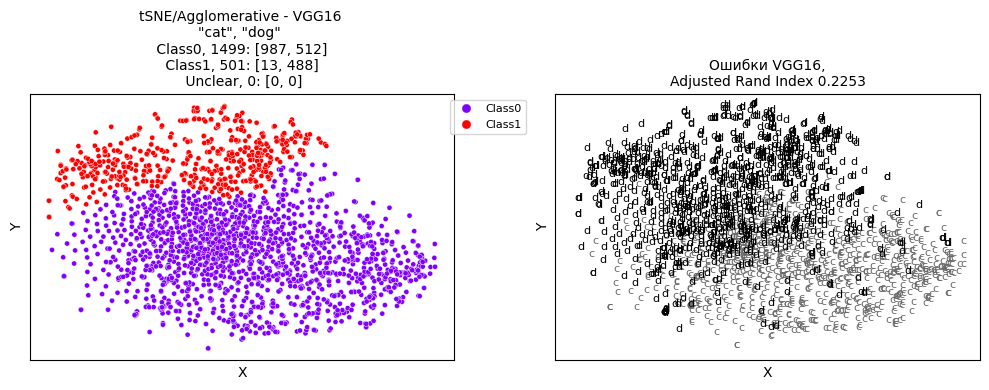

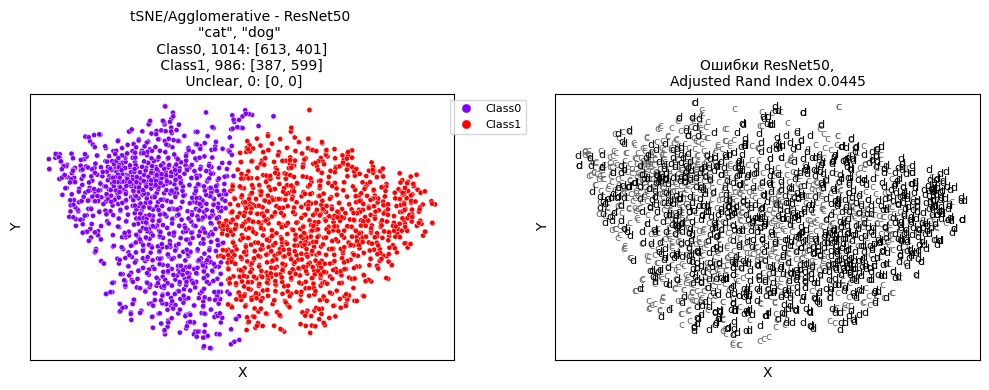

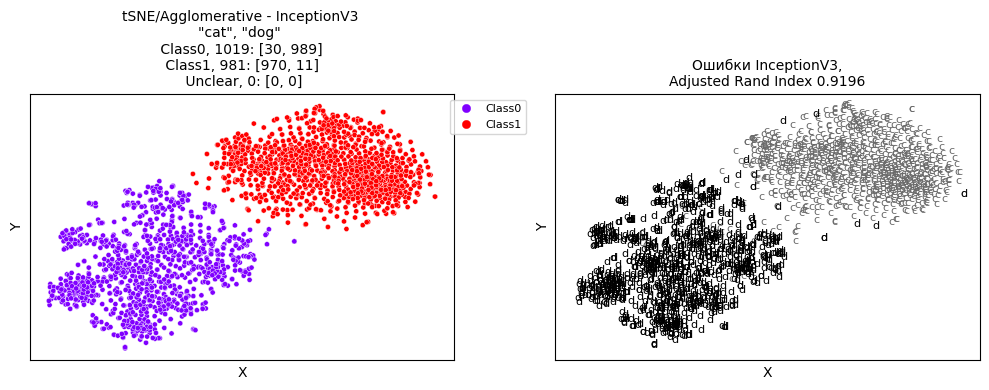

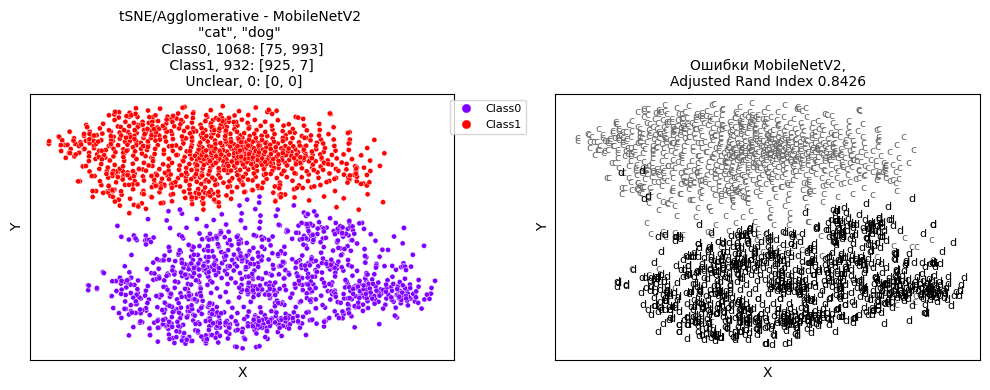

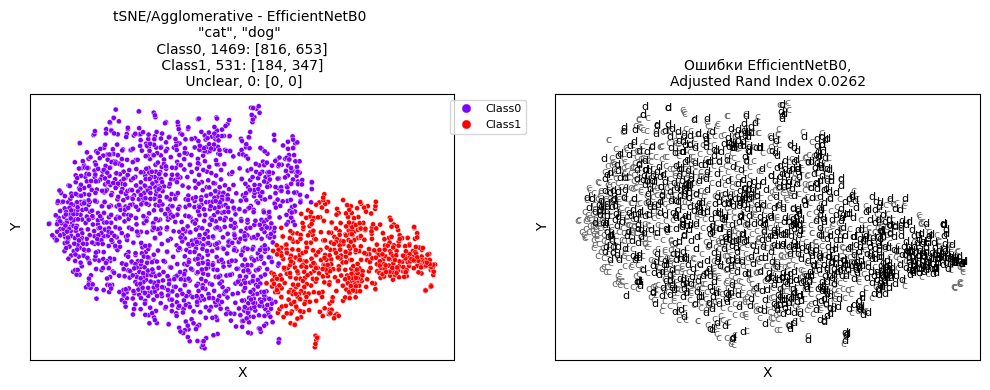

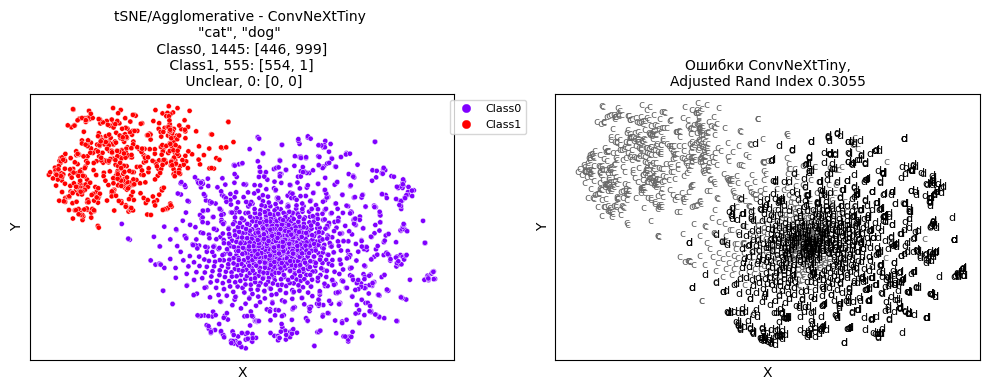

In [ ]:
# Вызов функции с кластеризатором Agglomerative на 2 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=False, HDBSCAN=False, hierarchical=True)

**Кластеризация на 4 класса по 500 изображений**

In [ ]:
def zzz(features, image_cluster, model, filess, kmeans=True, HDBSCAN=True, hierarchical=True):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    if kmeans:
        pca = PCA(n_components=2)
        clust_embedding = pca.fit_transform(features)
        kmeans = KMeans(n_clusters=4, n_init=10)
        clusters = kmeans.fit_predict(clust_embedding)
    if HDBSCAN:
        clust_embedding = umap.UMAP(init='random', n_neighbors=5, n_components=2, min_dist=0.0).fit_transform(features)
        hdbscan_ = hdbscan.HDBSCAN(min_samples=120, min_cluster_size=80)
        clusters = hdbscan_.fit_predict(clust_embedding)
    if hierarchical:
        clust_embedding = TSNE(n_components=2, verbose=0, n_iter=20000).fit_transform(features)
        clustering = AgglomerativeClustering(n_clusters=4, linkage='average')
        clusters = clustering.fit_predict(clust_embedding)

    image_cluster["clusterid"] = clusters

    class0 = len(image_cluster[image_cluster["clusterid"] == 0])
    class1 = len(image_cluster[image_cluster["clusterid"] == 1])
    class2 = len(image_cluster[image_cluster["clusterid"] == 2])
    class3 = len(image_cluster[image_cluster["clusterid"] == 3])
    noClass4 = len(image_cluster[image_cluster["clusterid"] == 4])
    noClass5 = len(image_cluster[image_cluster["clusterid"] == 5])
    unclear = len(image_cluster[image_cluster["clusterid"] == -1])

    class0_counts = [image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('airplane').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('flower').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('motorbike').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 0, 'image'].str.contains('person').sum()]

    class1_counts = [image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('airplane').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('flower').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('motorbike').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 1, 'image'].str.contains('person').sum()]

    class2_counts = [image_cluster.loc[image_cluster['clusterid'] == 2, 'image'].str.contains('airplane').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 2, 'image'].str.contains('flower').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 2, 'image'].str.contains('motorbike').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 2, 'image'].str.contains('person').sum()]

    class3_counts = [image_cluster.loc[image_cluster['clusterid'] == 3, 'image'].str.contains('airplane').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 3, 'image'].str.contains('flower').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 3, 'image'].str.contains('motorbike').sum(),
                    image_cluster.loc[image_cluster['clusterid'] == 3, 'image'].str.contains('person').sum()]

    noclass4_counts = [image_cluster.loc[image_cluster['clusterid'] == 4, 'image'].str.contains('airplane').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 4, 'image'].str.contains('flower').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 4, 'image'].str.contains('motorbike').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 4, 'image'].str.contains('person').sum()]

    noclass5_counts = [image_cluster.loc[image_cluster['clusterid'] == 5, 'image'].str.contains('airplane').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 5, 'image'].str.contains('flower').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 5, 'image'].str.contains('motorbike').sum(),
                      image_cluster.loc[image_cluster['clusterid'] == 5, 'image'].str.contains('person').sum()]

    unclear_counts = [image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('airplane').sum(),
                     image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('flower').sum(),
                     image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('motorbike').sum(),
                     image_cluster.loc[image_cluster['clusterid'] == -1, 'image'].str.contains('person').sum()]


    # Визуализация кластеризации
    cluster_names = ['Class0', 'Class1', 'Class2', 'Class3', 'Unclear']
    scatter = ax[0].scatter(clust_embedding[:, 0], clust_embedding[:, 1], c=clusters, s=14, marker="o",
                            linewidth=0.3, edgecolor='white', picker=True, cmap='rainbow')

    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_xlabel("X")
    ax[0].set_ylabel("Y")

    unclear = unclear + noClass4 + noClass5
    lst = [unclear_counts, noclass4_counts, noclass5_counts]
    un_sum_lst = list(map(lambda *x: sum(x), *lst))

    if kmeans:
        ax[0].set_title(f'PCA/KMeans - {model} \n'
                        f'"airplane", "flower", "motorbike", "person" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Class2, {class2}: {class2_counts} \n'
                        f' Class3, {class3}: {class3_counts} \n'
                        f' Unclear, {unclear}: {un_sum_lst}', fontsize=10, ha='center')
    if HDBSCAN:
        ax[0].set_title(f'UMAP/HDBSCAN - {model} \n'
                        f'"airplane", "flower", "motorbike", "person" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Class2, {class2}: {class2_counts} \n'
                        f' Class3, {class3}: {class3_counts} \n'
                        f' Unclear, {unclear}: {un_sum_lst}', fontsize=10, ha='center')
    if hierarchical:
        ax[0].set_title(f'tSNE/Agglomerative - {model} \n'
                        f'"airplane", "flower", "motorbike", "person" \n'
                        f' Class0, {class0}: {class0_counts} \n'
                        f' Class1, {class1}: {class1_counts} \n'
                        f' Class2, {class2}: {class2_counts} \n'
                        f' Class3, {class3}: {class3_counts} \n'
                        f' Unclear, {unclear}: {un_sum_lst}', fontsize=10, ha='center')

    ax[0].legend(handles=scatter.legend_elements()[0],
                  labels=cluster_names, loc='upper center',
                  bbox_to_anchor=(1.08, 1), fontsize=8, markerscale=1)

    # Визуализация ошибочных точек
    for i in range(len(clust_embedding)):
        filename = os.path.basename(filess[i])
        name, extension = os.path.splitext(filename)

        first_letter = name[0]
        if 'airplane' in filename.lower():
            label = 'a'
        elif 'person' in filename.lower():
            label = 'p'
        elif 'motorbike' in filename.lower():
            label = 'm'
        elif 'flower' in filename.lower():
            label = 'f'

        if label == 'a':
            color = 'lightgray'
        elif label == 'p':
            color = 'darkgray'
        elif label == 'm':
            color = 'dimgray'
        elif label == 'f':
            color = 'black'

        text = ax[1].text(clust_embedding[i, 0], clust_embedding[i, 1], label, color=color, fontsize=8)

    ax[1].scatter(clust_embedding[:, 0], clust_embedding[:, 1], c=clusters, s=16, marker="o",
                  linewidth=0.3, picker=True, alpha=0.6, cmap=ListedColormap(['white', 'white']))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_xlabel("X")
    ax[1].set_ylabel("Y")

    label = [0 if "airplane" in fil else 1 if "person" in fil else 2 if "motorbike" in fil else 3 for fil in filess]
    ari = adjusted_rand_score(clusters, label)
    ax[1].set_title(f'Ошибки {model},\nAdjusted Rand Index {ari:.4f}', fontsize=10)

    if kmeans:
        with open('/content/drive/MyDrive/FFF/ari_kmeans4.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')
    elif HDBSCAN:
        with open('/content/drive/MyDrive/FFF/ari_HDBSCAN4.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')
    elif hierarchical:
        with open('/content/drive/MyDrive/FFF/ari_hierarchical4.txt', 'a') as f:
            f.write(f'{ari:.4f}\n')

    plt.tight_layout()
    plt.show()

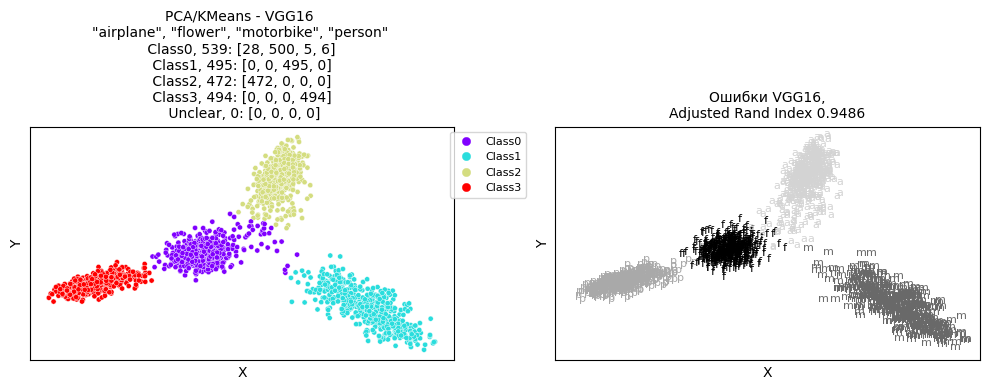

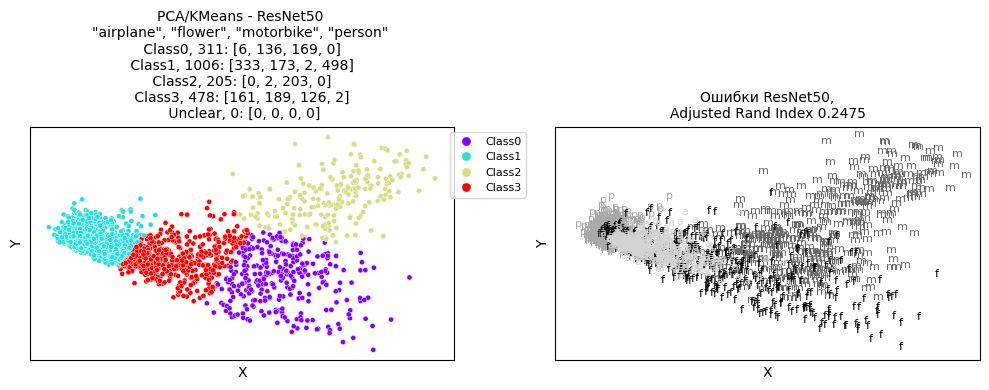

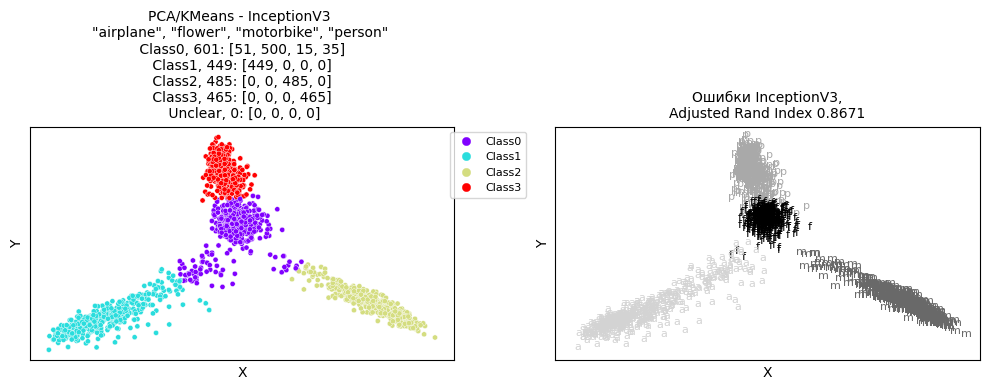

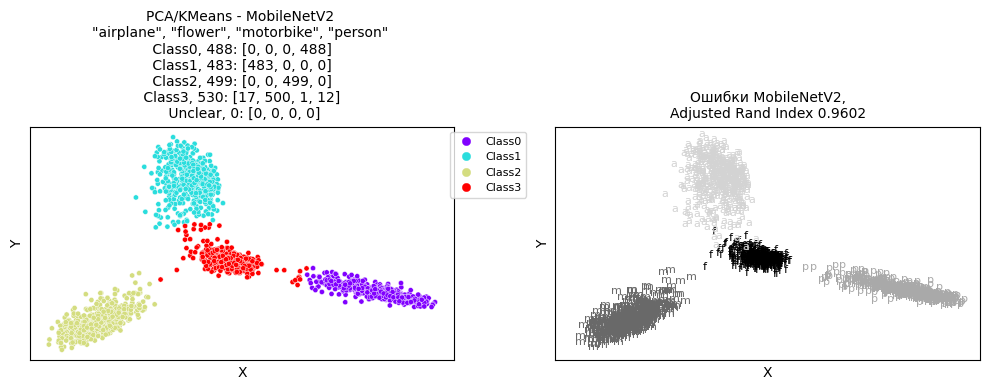

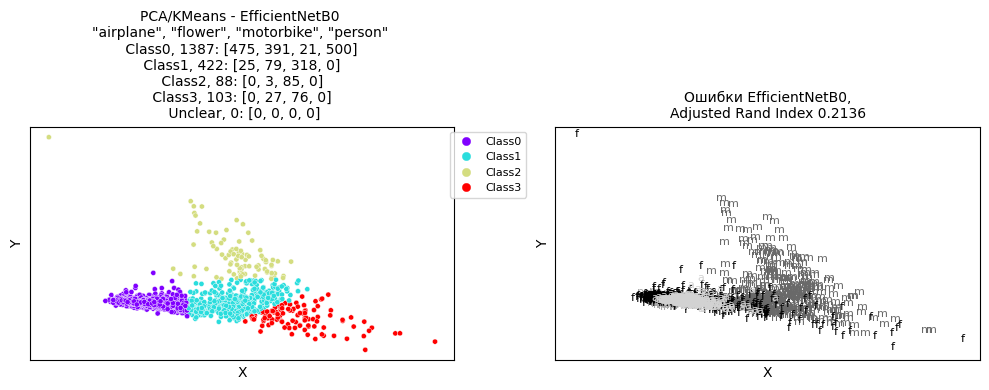

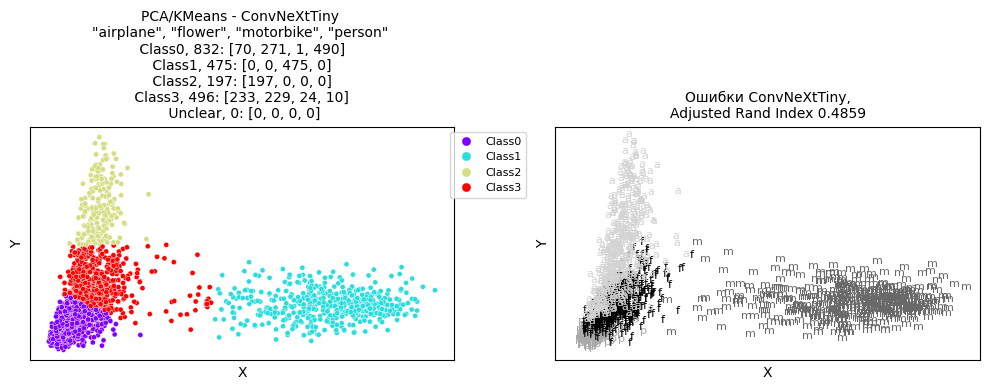

In [ ]:
# Вызов функции с кластеризатором KMeans на 4 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=True, HDBSCAN=False, hierarchical=False)

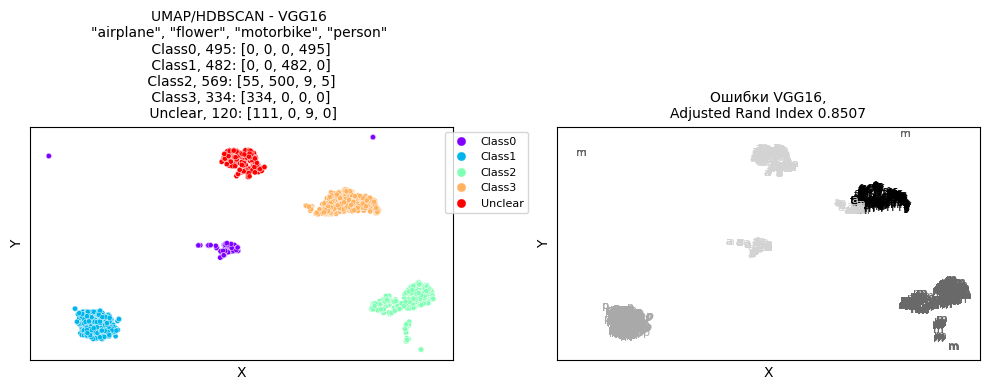

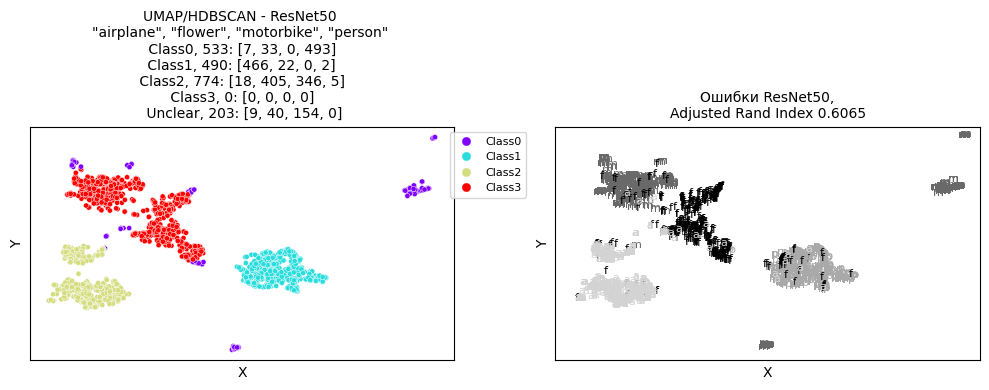

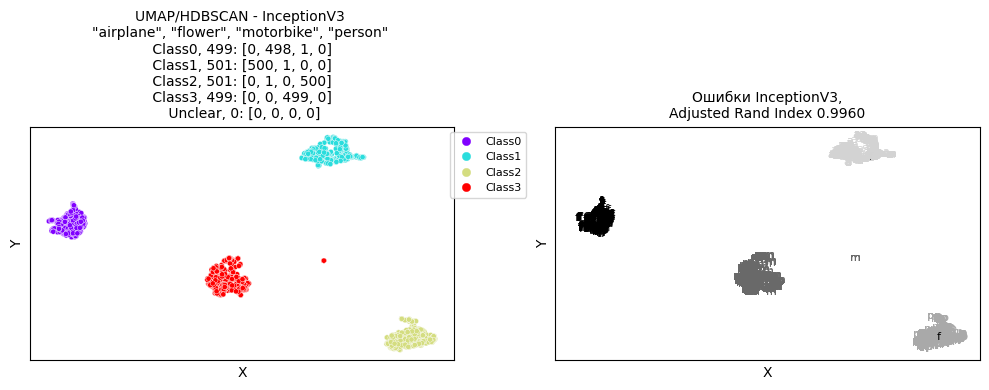

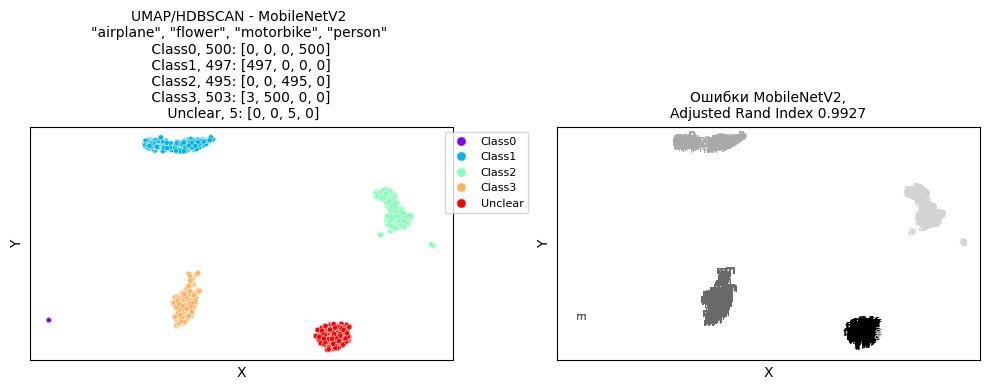

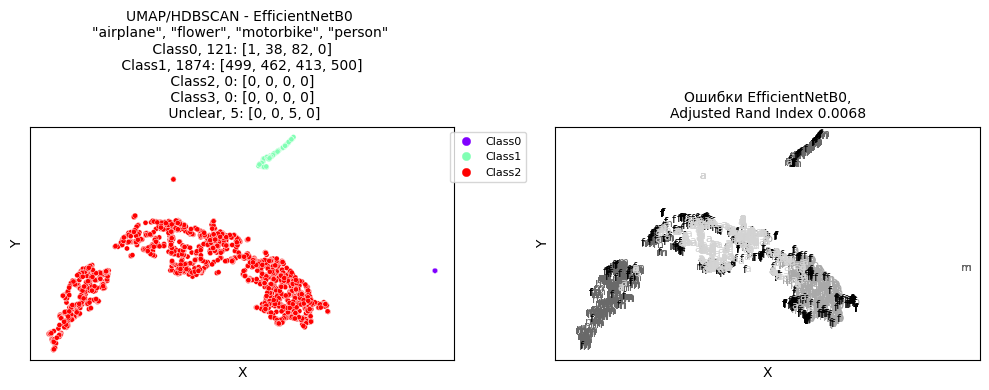

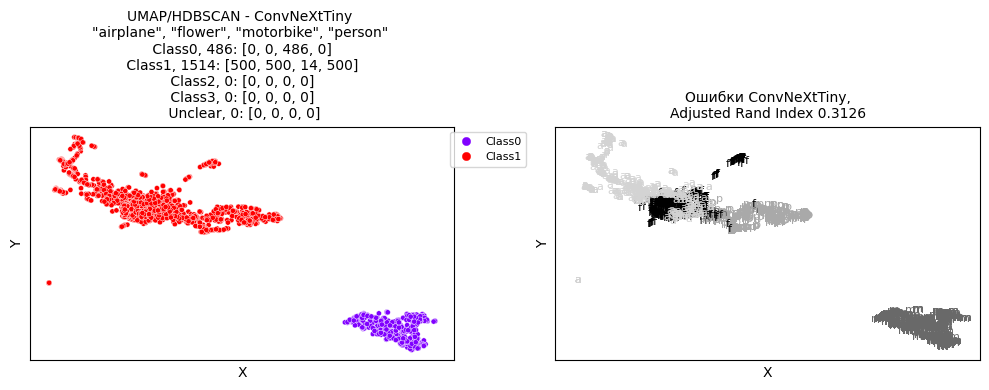

In [ ]:
# Вызов функции с кластеризатором HDBSCAN на 4 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=False, HDBSCAN=True, hierarchical=False)

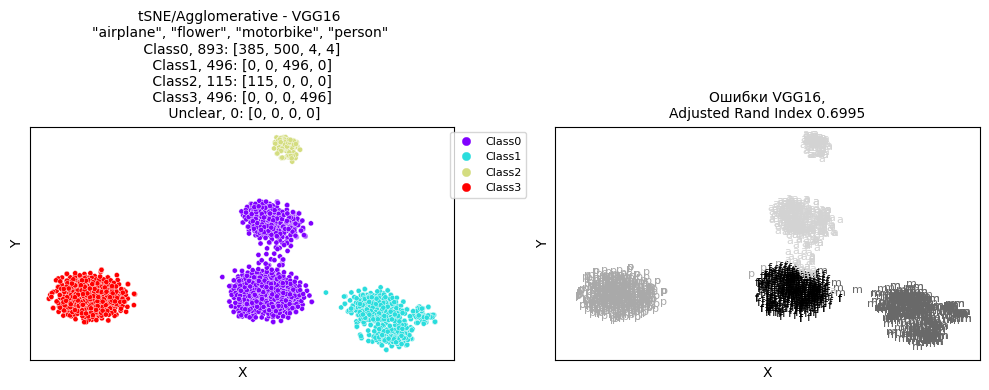

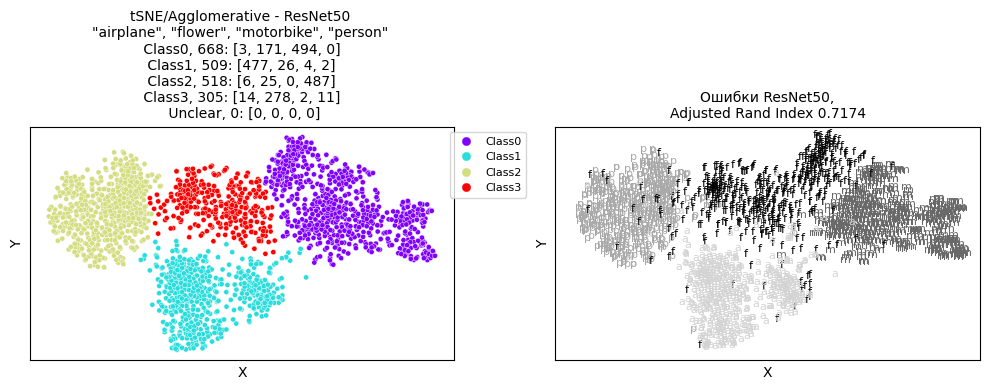

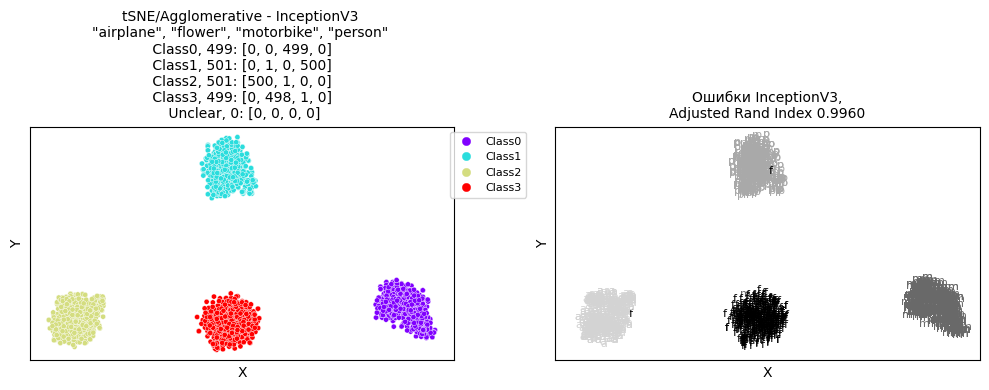

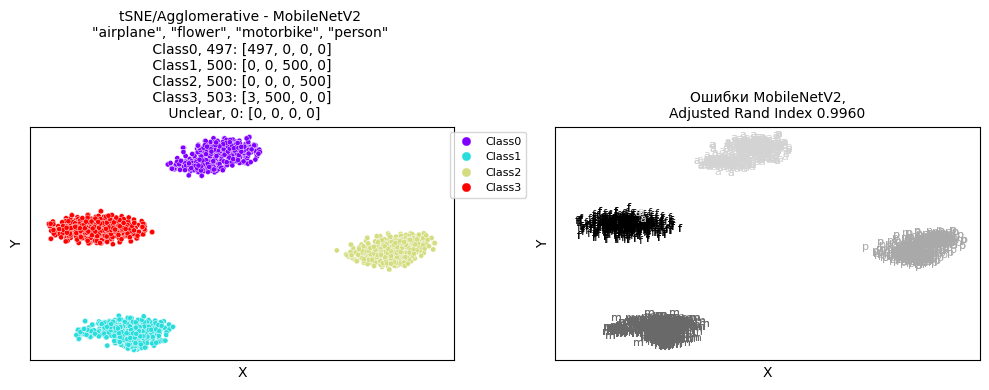

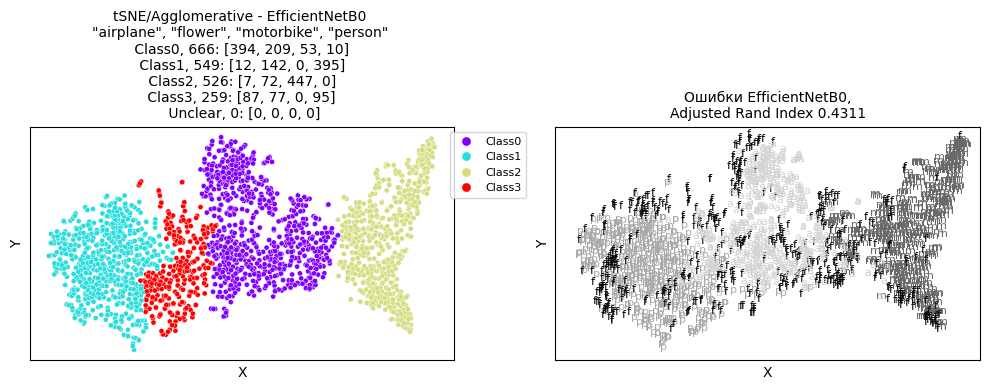

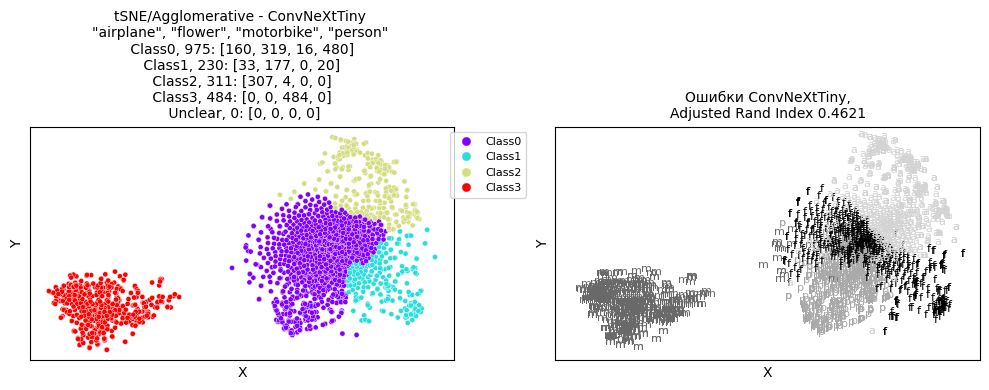

In [ ]:
# Вызов функции с кластеризатором Agglomerative на 4 класса

for i, model in enumerate(models):
    zzz(features_list[i], image_cluster, model, filess, kmeans=False, HDBSCAN=False, hierarchical=True)

**РЕЗУЛЬТАТ**

Лучшие результаты показали модели:

**InceptionV3**
- датасет на 2 класса - средний ARI = 0.8859
- датасет на 4 класса - средний ARI = 0.9530

**MobileNetV2**.
- датасет на 2 класса - средний ARI = 0.8636
- датасет на 4 класса - средний ARI = 0.9829

Они же оказались самыми стабильными, то есть их результативность не менялась в зависимости от кластеризатора.

Стоит отметить, что самую хорошую сепарированность кластеров (well-separated clusters) для моделей InceptionV3 и MobileNetV2 удалось получить при помощи  tSNE/AgglomerativeClustering и UMAP/HDBSCAN на датасете на 4 класса.

Анализ признаков датасета на 2 класса (кошки и собаки) вызвал больше затруднений у всех моделей. Это объясняется тем, что датасет на 4 класса содержит более разнообразные и непохожие объекты (самолеты, цветы, мотциклы, портреты людей).

Модель **VGG16** показала хорошие результаты только на кластеризаторе KMeans на 4 класса, а в целом продемонстрировала нестабильную работу.

Средний ARI более современных моделей EfficientNetB0 и ConvNeXtTiny, а также ResNet50 оказался крайне низок.

In [ ]:
models = ['VGG16', 'ResNet50', 'InceptionV3', 'MobileNetV2', 'EfficientNetB0', 'ConvNeXtTiny']
ari_two_class = [0.2023, 0.0292, 0.8859, 0.8636, 0.0110, 0.2506]
ari_four_class = [0.8329, 0.5238, 0.9530, 0.9829, 0.2171, 0.4202]

tab = pd.DataFrame(data = {"Модель": models,
                           "2 класса": ari_two_class,
                           "4 класса": ari_four_class})
pd.options.display.float_format = '{:.4f}'.format
tab = tab.sort_values("2 класса",	ascending = False).set_index('Модель')
tab
numeric_columns = ['2 класса', '4 класса']
styles = [dict(selector="caption", props=[("font-size", "100%"),
                                            ("font-weight", "bold"),
                                            ("text-align", "center")])]
tab_meanARI = (tab
    .style
    .set_caption(f'Средние значения ARI моделей').set_table_styles(styles)
    .format(precision=4, subset=numeric_columns)
    .highlight_max(color='yellowgreen', subset=numeric_columns)
    .highlight_min(color='coral', subset=numeric_columns)
  )
display(tab_meanARI)

,2 класса,4 класса
Модель,,
InceptionV3,0.8859,0.9530
MobileNetV2,0.8636,0.9829
ConvNeXtTiny,0.2506,0.4202
VGG16,0.2023,0.8329
ResNet50,0.0292,0.5238
EfficientNetB0,0.0110,0.2171


In [ ]:
links = ['/content/drive/MyDrive/FFF/ari_kmeans2.txt',
         '/content/drive/MyDrive/FFF/ari_HDBSCAN2.txt',
         '/content/drive/MyDrive/FFF/ari_hierarchical2.txt',
         '/content/drive/MyDrive/FFF/ari_kmeans4.txt',
         '/content/drive/MyDrive/FFF/ari_HDBSCAN4.txt',
         '/content/drive/MyDrive/FFF/ari_hierarchical4.txt']

results = []

for link in links:
    with open(link, 'r') as file:
        content = file.readlines()
        values = [float(line.strip()) for line in content]
        results.append(values)

KM2, HD2, tA2, KM4, HD4, tA4 = results

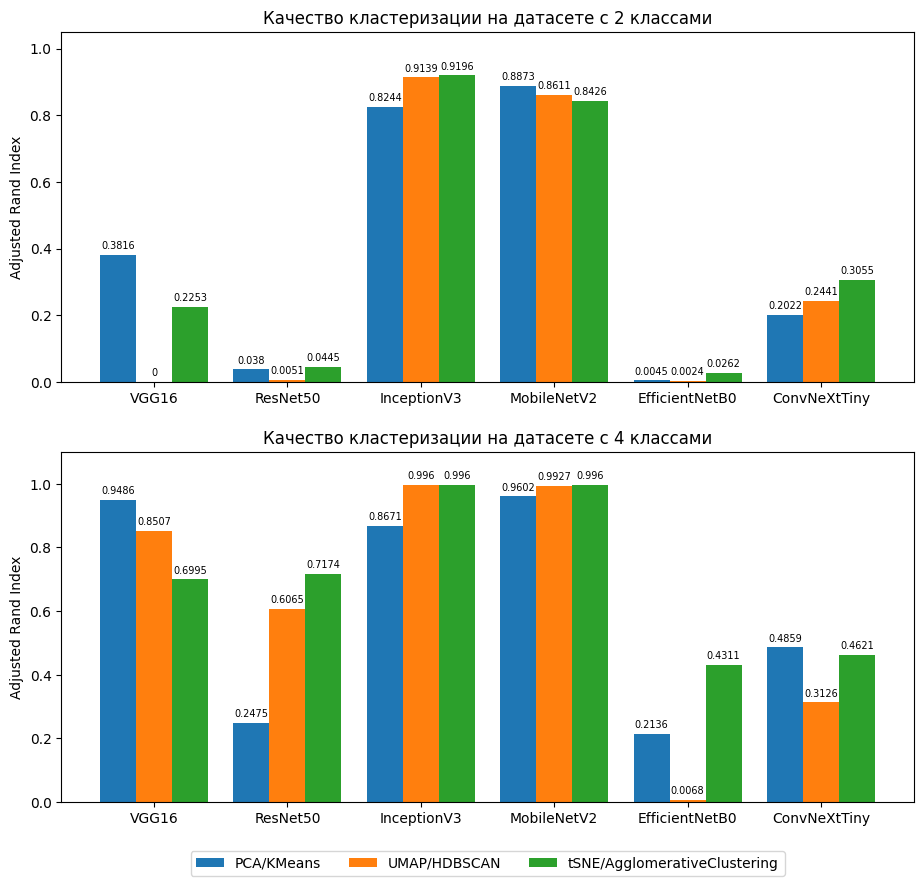

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(11, 10))
models = ('VGG16', 'ResNet50', 'InceptionV3', 'MobileNetV2', 'EfficientNetB0', 'ConvNeXtTiny')
x = np.arange(len(models))
width = 0.27
multiplier = 0

models_means1 = {'PCA/KMeans': KM2,
                'UMAP/HDBSCAN': HD2,
                'tSNE/AgglomerativeClustering': tA2}
models_means2 = {'PCA/KMeans': KM4,
                 'UMAP/HDBSCAN': HD4,
                'tSNE/AgglomerativeClustering': tA4}

for attribute, measurement in models_means1.items():
    offset = width * multiplier
    rects = ax[0].bar(x + offset, measurement, width, label=attribute)
    ax[0].bar_label(rects, padding=3, fontsize=7)
    multiplier += 1

for attribute, measurement in models_means2.items():
    offset = width * multiplier
    rects = ax[1].bar(x + offset, measurement, width, label=attribute)
    ax[1].bar_label(rects, padding=3, fontsize=7)
    multiplier += 1

ax[0].set_ylabel('Adjusted Rand Index')
ax[0].set_title('Качество кластеризации на датасете с 2 классами')
ax[0].set_xticks(x + width)
ax[0].set_xticklabels(models)
ax[0].set_ylim(0, 1.05)

ax[1].set_ylabel('Adjusted Rand Index')
ax[1].set_title('Качество кластеризации на датасете с 4 классами')
ax[1].set_xticks(x + width * 4)
ax[1].set_xticklabels(models)
ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.12), fontsize=10, markerscale=1, ncol=3)

ax[1].set_ylim(0, 1.1)

plt.show()